In [1]:
from sklearn.datasets import make_classification
from matplotlib import pyplot as plt
import seaborn as sns
import numpy as np
import pandas as pd
from scipy import stats
import matplotlib.pyplot as plt
import random
import time



/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


In [2]:
#User input for algorithm:
#for synthetic data/potentially for regular datasets user can set the total subgroups/centroids
centroids = input("Enter number of centroids: ")
groups = input("Enter number of groups: ")

Enter number of centroids: 10
Enter number of groups: 6


In [3]:
#calculates euclidean distance between points
def calc_dist(x,y,x_ref,y_ref):
  return np.sqrt((((x-x_ref)**2)+((y-y_ref)**2))) 


In [4]:
#calculuates loss by inputting euclidean distance into sigmoid function
def calc_loss(x,y,x_ref,y_ref):
    # calculate Euclidean distance btw person & centroid
    distance = calc_dist(x,y,x_ref,y_ref)
    # refer to the above distance function to determine individual loss
    loss = 1/(1+ np.exp(-1*distance)) #converts distances to probability distribution
    #return loss
    return loss

In [5]:
#function plots individual loss of all points within a cluster for all clusters in dataset
def graph_loss(tot_loss):
  print(tot_loss)
  # plt.plot(tot_loss)
  # plt.title('Cost per iteration')
  # plt.show()


In [6]:
#this function calculates the summation of all the individual losses within each cluster for minimizing the objective function
def sum_loss(df, centroids):
  #total datapoints
  tot_len = 0
  #sum of all individual losses between clusters
  loss_sum = 0
  clusters = []
  for i in centroids.keys():
    temp = df[df['min_centr']==i]
    temp = temp.reset_index()
    clusters.append(temp)
    tot_len += len(temp)
    loss_sum += temp['min_loss'].sum()
  tot_loss = loss_sum/tot_len
  graph_loss(tot_loss)
  return tot_loss


In [7]:
def assign_cluster(df, centroids):
  start = time.time()
  for i in centroids.keys():
    #loss based on euclidean distance for each individual point compared to both centroids
    #stored in dataframe
    df['loss_from_{}'.format(i)] = calc_loss(df['x_coord'], df['y_coord'], centroids[i][0], centroids[i][1])
    df['dist_from_{}'.format(i)] = calc_dist(df['x_coord'], df['y_coord'], centroids[i][0], centroids[i][1])

  centroid_dist_col = ['loss_from_{}'.format(i) for i in centroids.keys()]

  #df column which holds the value of the closest centroid for each point
  df['min_centr'] = df.loc[:, centroid_dist_col].idxmin(axis=1)
  df['min_centr'] = df['min_centr'].map(lambda x: int(x.lstrip('loss_from_')))
  #value of loss calculated from sigmoid in calc_loss function for individual loss
  df['min_loss'] = df[['loss_from_{}'.format(i) for i in centroids.keys()]].min(axis=1)
  end = time.time()
  print('Time elapsed Assignment Step: ', end - start)

  #delete unnecessary columns
  for i in range(len(centroids)):
    del df['loss_from_{}'.format(i)]
    lst = df['min_centr'].unique()
    if i not in lst:
      del df['dist_from_{}'.format(i)]
  return df

In [8]:
# this function compares the loss between two groups at a certain percentile level
def compare_loss(group1,group2,percentile):
    select_group = [group1, group2]
    percentile_loss = []
    for s in select_group:
        s.sort_values(by=['min_loss'])
        subgroup = [s['min_loss']] # subset the two different groups of interest
        loss_p = stats.scoreatpercentile(subgroup, percentile) # find the level of loss at given percentile
        percentile_loss.append(loss_p) # load list with loss    
    difference = percentile_loss[0]-percentile_loss[1] # find difference between two @ percentile
    return np.abs(difference)

In [9]:
#calculates gradient for clusters
def update_weights(clust, lr, centr, df):

  x_deriv, y_deriv = 0, 0
  #total number of points in cluster 0 (points nearest to centroid 0)
  #updated centroid coordinates 
  new_centr_x, new_centr_y = centr[0], centr[1]

  #gets new assignments for clusters based on euclidean distance

  #calculate partial derivatives of euclidean distance functions

  x = clust['x_coord']
  y = clust['y_coord']
  # print('x ', x)
  # print('y ', y)
  center = clust['min_centr']
  # print('center ', center)
  distance = clust['dist_from_{}'.format(int(center))]

  numerator_x = centr[0]-x
  denominator_x = distance
  grad_x = (numerator_x/denominator_x)

  numerator_y = centr[1]-y
  denominator_y = distance
  grad_y = (numerator_y/denominator_y)

  x_deriv += grad_x
  y_deriv += grad_y
  
  loss_grad_x = x_deriv
  loss_grad_y = y_deriv
  # print('lr ', lr)

  new_centr_x -= (loss_grad_x) * lr
  new_centr_y -= (loss_grad_y) * lr
  # print(new_centr_x, new_centr_y)
  return (new_centr_x, new_centr_y)





In [10]:
#updates centroid locations based on gradient descent and loss constraint
def update(perc, centroids,loss, df):
  tot_loss_lst = []
  subgroup_loss_lst = []
  tot_loss_lst.append(loss)
  b = 32
  max_iter = 50
  iter_num = 0
  groups = compute_groups(df)
  groups_len = []
  for group in groups:
    groups_len.append(len(group))
  clusters = compute_clusters(df)
  cdf1, cdf2 = compute_cdf(groups)
  #subgroup loss between max and min loss
  subgroup_loss = compare_loss(groups[cdf1], groups[cdf2], 50)
  #total subgroup loss to be used for evaluation with constraint
  subgroup_loss_lst.append(subgroup_loss)

  L = perc * subgroup_loss
  print('L: ', L)
  #set temporary centroids for assignment
  temp_centroids = {}
  for i in centroids.keys():
    temp_centroids[i] = centroids[i]
  count = {}
  for i in centroids.keys():
    count[i] = 0

  #beginning of updating 
  # while subgroup_loss > L and iter_num < max_iter:
  while iter_num < max_iter:

    start = time.time()
    old_loss = subgroup_loss
    #set up for mini batch gradient descent
    samp = df.sample(n=b, random_state=1)
    samp = samp.reset_index()
    start = time.time()
    for i in centroids.keys():
      count[i] = 0
    for s in range(len(samp)):
      clust = samp.iloc[s]['min_centr']
      clust = int(clust)
      count[clust]+=1
      lr = 1/count[clust]
      temp = update_weights(samp.iloc[s], lr, temp_centroids[clust], df)
      temp_centroids[clust] = temp
    end = time.time()
    print('Time elapsed Batch Step: ', end - start)

    #testing to see if new centroid locations improve summation of individual loss

    temp_df = assign_cluster(df, temp_centroids)
    groups = compute_groups(temp_df)
    new_groups = []
    for group in groups:
      new_groups.append(len(group))
    cdf1, cdf2 = compute_cdf(groups)

    temp_subgroup_loss = compare_loss(groups[cdf1], groups[cdf2], 50)   
    #total subgroup loss to be used for evaluation with constraint

    iter_num += 1
    print('iteration number: ', iter_num)

    
    if old_loss != temp_subgroup_loss:
      #only change centroid locations if it improves subgroup loss
      if old_loss > temp_subgroup_loss:
        subgroup_loss = temp_subgroup_loss

        for i in centroids.keys():
          centroids[i] = temp_centroids[i]
      print('subgroup loss: ', subgroup_loss)
      loss = sum_loss(temp_df, centroids)
      tot_loss_lst.append(loss)
      subgroup_loss_lst.append(subgroup_loss)

      #graph new centroids in scatterplot
      fig = plt.figure(figsize=(5,5))
      ax = sns.scatterplot(X[:,0],X[:,1],hue=y)

      for i in centroids.keys():
        plt.scatter(centroids[i][0], centroids[i][1], color=color_map[i])
      df = assign_cluster(df, centroids)
      plt.xlim(0, 8)
      plt.ylim(0, 8)
      ax.set_title("Synthetic Data");
      plt.show()

    else:
      end = time.time()
      print('Time elapsed End of Update Step: ', end - start)
      plt.title('Cost per iteration')
      plt.plot(tot_loss_lst)
      plt.show()
      plt.title('Subgroup loss per iteration')
      plt.plot(subgroup_loss_lst)
      plt.show()
      return centroids
  plt.title('Cost per iteration')
  plt.plot(tot_loss_lst)
  plt.show()
  plt.title('Subgroup loss per iteration')
  plt.plot(subgroup_loss_lst)
  plt.show()
  print('Reached max iterations')
  return centroids    

In [11]:
def compute_cdf(groups):
  lst = []
  perc = []
  for group in groups:
    sorted_data = group.sort_values(by=['min_loss'])
    sorted_len = len(sorted_data['min_loss'])
    yvals = np.arange(sorted_len)/float(sorted_len-1)
    lst.append(sorted_data['min_loss'].sum())
    subgroup = [sorted_data['min_loss']] # subset the two different groups of interest
    perc.append(stats.scoreatpercentile(subgroup, 50))
    plt.plot(sorted_data['min_loss'], yvals)
  plt.xlabel('loss per individual')
  plt.ylabel('% of people within certain loss of centroid')
  plt.title('Individual loss- CDF stratified by group')
  plt.show()
  min_ind = perc.index(min(perc))
  max_ind = perc.index(max(perc))

  return (max_ind, min_ind)

 

  #blue = 0 (blue points)
  #red = 1 (red points)

In [12]:
def compute_groups(df):
  num_groups = df.group.nunique()
  groups = []
  for i in range(num_groups):
    group = df[df['group']==i]
    group = group.reset_index()
    groups.append(group)
  return groups


In [13]:
def compute_clusters(df):
  num_clusters = df.min_centr.nunique()
  clusters = []
  for i in range(num_clusters):
    cluster = df[df['min_centr']==i]
    cluster = cluster.reset_index()
    clusters.append(cluster)
  return clusters


Time elapsed Assignment Step:  0.3712034225463867


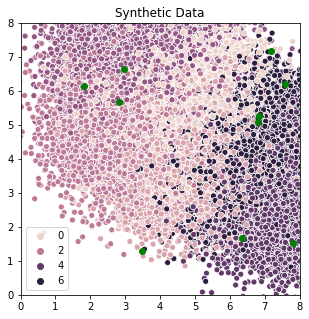

In [14]:
from sklearn.datasets import make_blobs


# Generate Imbalanced Synthetic Data
# X,y = make_classification(n_samples=500, n_classes=3,shift=4 ,n_informative=4, n_redundant=0, n_repeated=0, n_clusters_per_class=2,class_sep=.8,flip_y=0,weights=[0.80,.1,.1], random_state=55)
center_box = (0,8)
X, y = make_blobs(n_samples=100000, centers=int(groups), n_features=2,center_box=center_box,random_state=0)
# create dataframe to hold x and y coordinates
df = pd.DataFrame({
    'x_coord': X[:,0],
    'y_coord': X[:,1]
})

#red vs blue points
#if group = 0, then the point is in the blue group
# if group = 1, then the point is in the red group
df['group'] = y

# np.random.seed(42)

#arbitrarily picked random k (number of centroids)
k = int(centroids)
centroids = {}
#randomly initialized centroid x and y coordinates (in real data we will actually have these coordinates)
for i in range(k):
  centroids[i] = ((random.uniform(1,8)), (random.uniform(1,8)))
#colors for centroids
color_map = {}
for i in range(k):
  color_map[i] = 'g'

#plot synthetic data
fig = plt.figure(figsize=(5,5))
ax = sns.scatterplot(X[:,0],X[:,1],hue=y)

for i in centroids.keys():
  plt.scatter(centroids[i][0], centroids[i][1], color=color_map[i])
df = assign_cluster(df, centroids)
df
plt.xlim(0, 8)
plt.ylim(0, 8)
ax.set_title("Synthetic Data")
plt.show()



In [15]:
df = assign_cluster(df, centroids)
df

Time elapsed Assignment Step:  0.3818669319152832


,x_coord,y_coord,group,dist_from_0,dist_from_1,dist_from_2,dist_from_3,dist_from_4,dist_from_5,dist_from_6,dist_from_7,dist_from_8,dist_from_9,min_centr,min_loss
0,5.104937,4.664734,1,3.607961,1.829660,3.739076,1.756221,3.228937,3.254480,4.161554,2.906582,2.492581,2.918270,3,0.852736
1,6.817436,4.148071,4,5.385988,1.109891,4.393593,0.931142,2.513475,3.054704,2.821050,4.582006,4.272487,2.185992,3,0.717307
2,7.050565,3.201476,4,6.007940,2.067518,4.052927,1.892870,1.679300,3.982951,1.857229,5.334186,4.896850,3.039500,4,0.842812
3,4.496954,3.536849,1,3.746410,2.903782,2.459476,2.781401,2.614628,4.518916,3.892231,3.456646,2.720472,4.077709,2,0.921252
4,7.090609,4.846683,5,5.430678,0.483682,5.066733,0.363227,3.254148,2.337289,3.414213,4.492084,4.340689,1.435937,3,0.589821
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
99995,6.184986,4.638229,0,4.621457,0.898583,4.301211,0.766182,2.961535,2.727356,3.528784,3.785321,3.513323,2.096086,3,0.682694
99996,8.309533,1.431658,4,8.027956,4.100158,4.840885,3.943155,1.986812,5.863499,0.495316,7.457087,6.936939,4.814684,6,0.621358
99997,6.956043,4.006753,5,5.567894,1.256822,4.412057,1.082132,2.406691,3.182963,2.640868,4.775360,4.453477,2.276187,3,0.746897
99998,6.709641,3.381892,4,5.622382,1.880156,3.849585,1.700360,1.741260,3.828234,2.175546,4.957896,4.511575,2.945645,3,0.845582


Time elapsed Assignment Step:  0.37116074562072754
0.7764448936946406


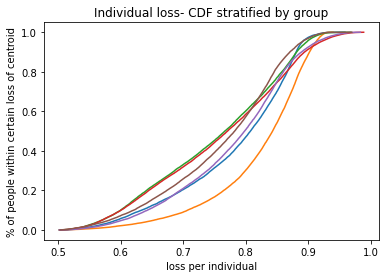

L:  0.053525246561223504
Time elapsed Batch Step:  0.013355731964111328
Time elapsed Assignment Step:  0.35872936248779297


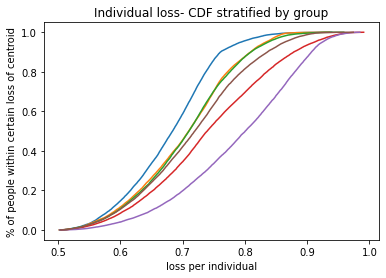

iteration number:  1
subgroup loss:  0.07646463794460501
0.7230946990136412
Time elapsed Assignment Step:  0.3550984859466553


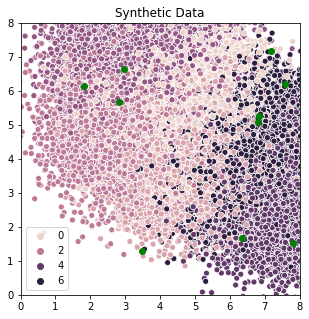

Time elapsed Batch Step:  0.02156853675842285
Time elapsed Assignment Step:  0.37487363815307617


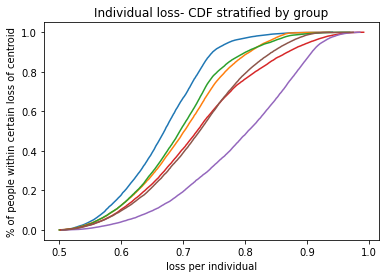

iteration number:  2
subgroup loss:  0.07646463794460501
0.7175515366838978
Time elapsed Assignment Step:  0.35786914825439453


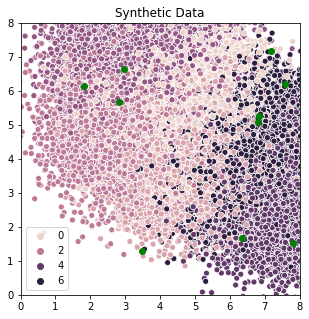

Time elapsed Batch Step:  0.020473957061767578
Time elapsed Assignment Step:  0.3730626106262207


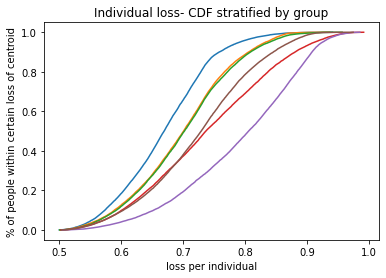

iteration number:  3
subgroup loss:  0.07646463794460501
0.7210314322397732
Time elapsed Assignment Step:  0.36618518829345703


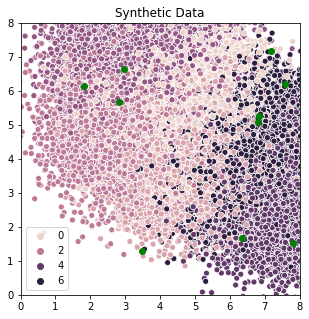

Time elapsed Batch Step:  0.021267175674438477
Time elapsed Assignment Step:  0.3834664821624756


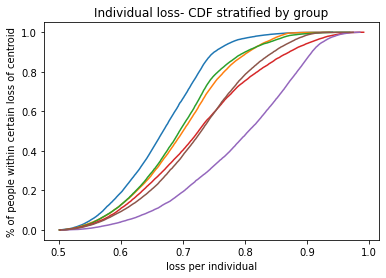

iteration number:  4
subgroup loss:  0.07646463794460501
0.7177628295611338
Time elapsed Assignment Step:  0.358567476272583


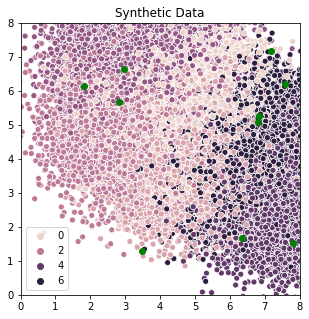

Time elapsed Batch Step:  0.02102971076965332
Time elapsed Assignment Step:  0.3805663585662842


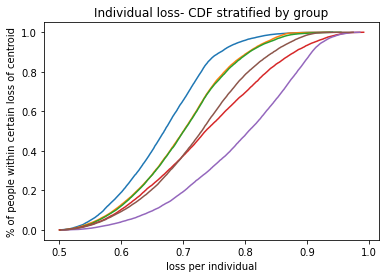

iteration number:  5
subgroup loss:  0.07646463794460501
0.720722892269042
Time elapsed Assignment Step:  0.3621046543121338


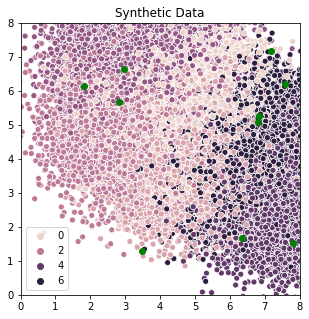

Time elapsed Batch Step:  0.02080559730529785
Time elapsed Assignment Step:  0.3781402111053467


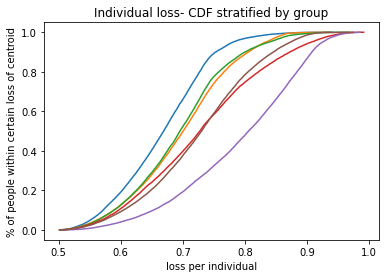

iteration number:  6
subgroup loss:  0.07646463794460501
0.7181779748199608
Time elapsed Assignment Step:  0.35212063789367676


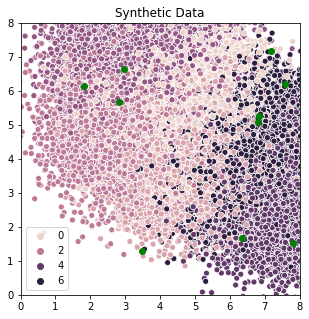

Time elapsed Batch Step:  0.021172523498535156
Time elapsed Assignment Step:  0.36922192573547363


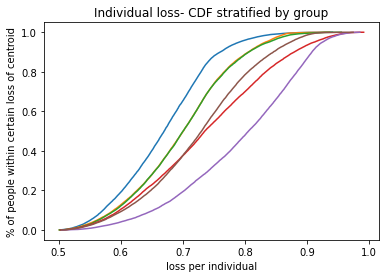

iteration number:  7
subgroup loss:  0.07646463794460501
0.7204806499171005
Time elapsed Assignment Step:  0.3503282070159912


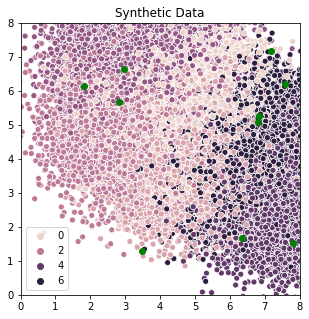

Time elapsed Batch Step:  0.02082514762878418
Time elapsed Assignment Step:  0.36989521980285645


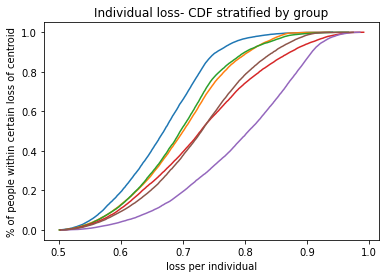

iteration number:  8
subgroup loss:  0.07646463794460501
0.7184828570709563
Time elapsed Assignment Step:  0.35185790061950684


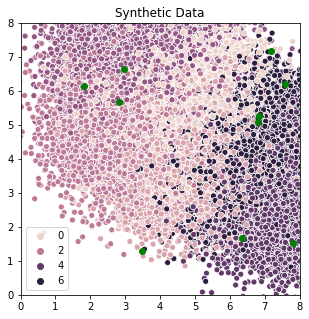

Time elapsed Batch Step:  0.0265042781829834
Time elapsed Assignment Step:  0.3833432197570801


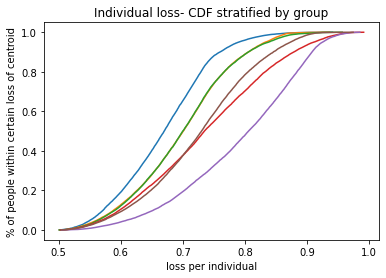

iteration number:  9
subgroup loss:  0.07646463794460501
0.7202753505095237
Time elapsed Assignment Step:  0.3635225296020508


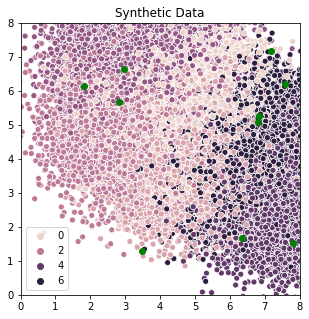

Time elapsed Batch Step:  0.021229028701782227
Time elapsed Assignment Step:  0.38634729385375977


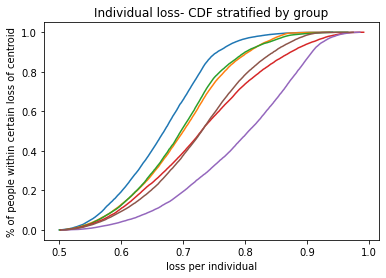

iteration number:  10
subgroup loss:  0.07646463794460501
0.7187102724936993
Time elapsed Assignment Step:  0.3588132858276367


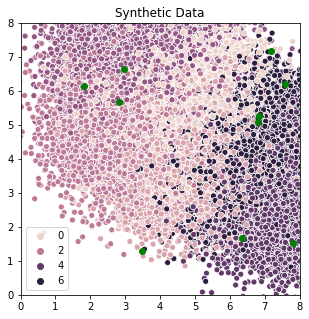

Time elapsed Batch Step:  0.022877931594848633
Time elapsed Assignment Step:  0.3843414783477783


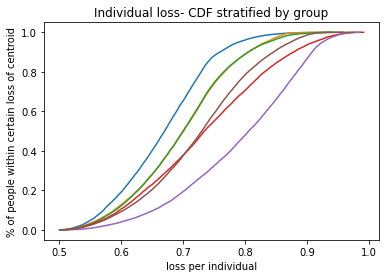

iteration number:  11
subgroup loss:  0.07646463794460501
0.7201074446547232
Time elapsed Assignment Step:  0.3690056800842285


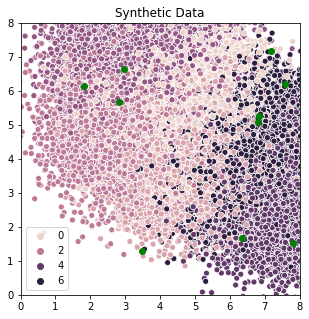

Time elapsed Batch Step:  0.02090930938720703
Time elapsed Assignment Step:  0.37552952766418457


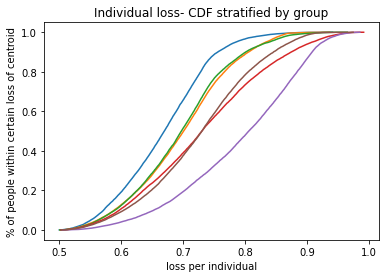

iteration number:  12
subgroup loss:  0.07646463794460501
0.7188837126838354
Time elapsed Assignment Step:  0.3512754440307617


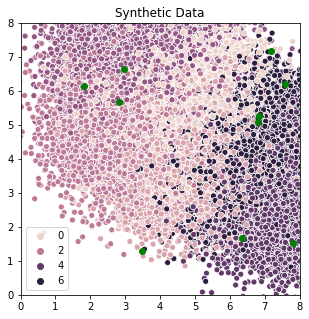

Time elapsed Batch Step:  0.02283191680908203
Time elapsed Assignment Step:  0.371502161026001


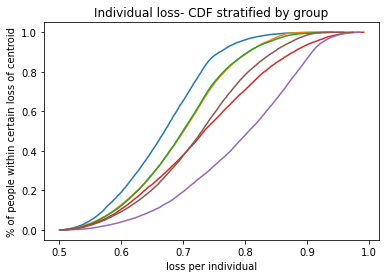

iteration number:  13
subgroup loss:  0.07646463794460501
0.7199725567796929
Time elapsed Assignment Step:  0.3575611114501953


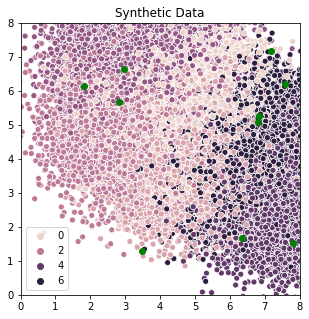

Time elapsed Batch Step:  0.02080392837524414
Time elapsed Assignment Step:  0.3762803077697754


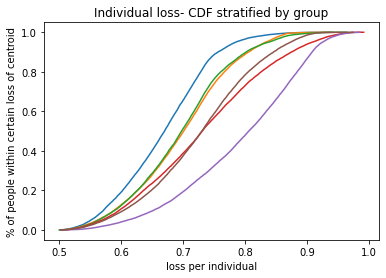

iteration number:  14
subgroup loss:  0.07646463794460501
0.7190168770847393
Time elapsed Assignment Step:  0.3603630065917969


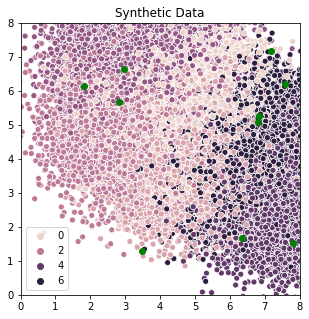

Time elapsed Batch Step:  0.021091938018798828
Time elapsed Assignment Step:  0.3718380928039551


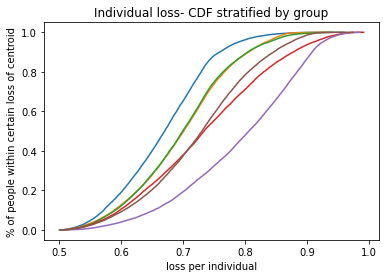

iteration number:  15
subgroup loss:  0.07646463794460501
0.719865352240638
Time elapsed Assignment Step:  0.3519425392150879


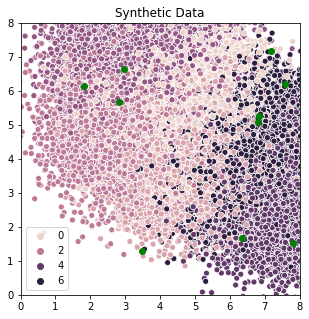

Time elapsed Batch Step:  0.022038698196411133
Time elapsed Assignment Step:  0.3717186450958252


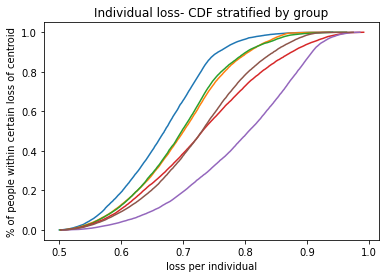

iteration number:  16
subgroup loss:  0.07646463794460501
0.7191196787328917
Time elapsed Assignment Step:  0.3517923355102539


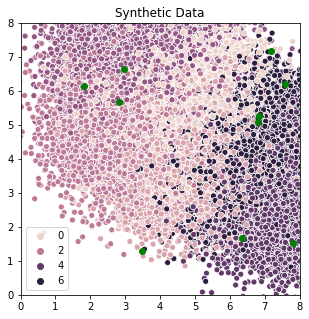

Time elapsed Batch Step:  0.021780967712402344
Time elapsed Assignment Step:  0.3665926456451416


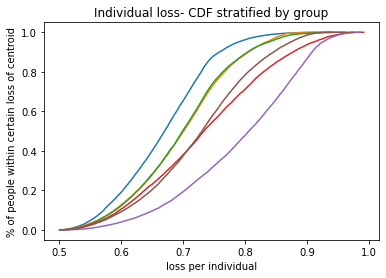

iteration number:  17
subgroup loss:  0.07646463794460501
0.7197809136346776
Time elapsed Assignment Step:  0.354672908782959


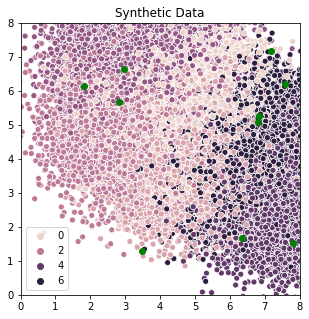

Time elapsed Batch Step:  0.021181344985961914
Time elapsed Assignment Step:  0.36893272399902344


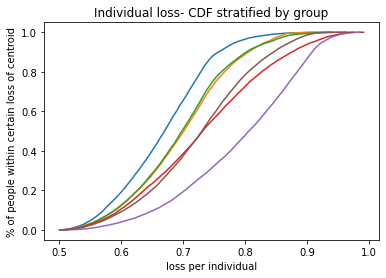

iteration number:  18
subgroup loss:  0.07646463794460501
0.71919912921284
Time elapsed Assignment Step:  0.356342077255249


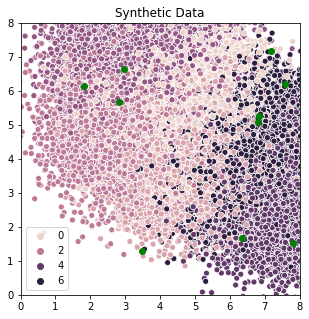

Time elapsed Batch Step:  0.013387918472290039
Time elapsed Assignment Step:  0.3907139301300049


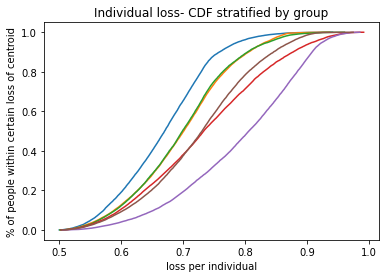

iteration number:  19
subgroup loss:  0.07646463794460501
0.7197144552302669
Time elapsed Assignment Step:  0.3499948978424072


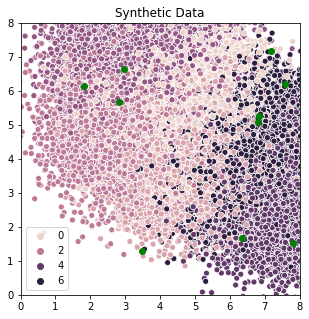

Time elapsed Batch Step:  0.021067380905151367
Time elapsed Assignment Step:  0.362048864364624


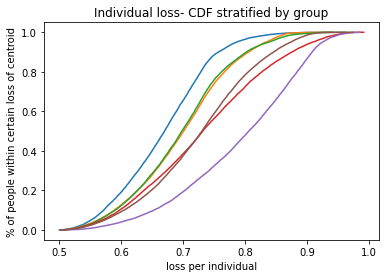

iteration number:  20
subgroup loss:  0.07646463794460501
0.7192606722238203
Time elapsed Assignment Step:  0.3544583320617676


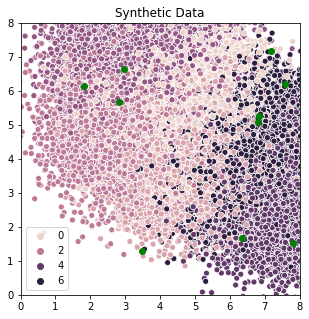

Time elapsed Batch Step:  0.021306991577148438
Time elapsed Assignment Step:  0.3792538642883301


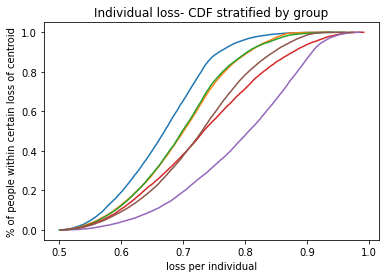

iteration number:  21
subgroup loss:  0.07646463794460501
0.7196622770896647
Time elapsed Assignment Step:  0.36304211616516113


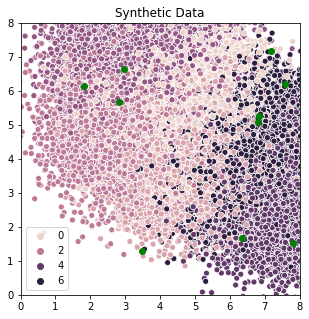

Time elapsed Batch Step:  0.021982669830322266
Time elapsed Assignment Step:  0.38296055793762207


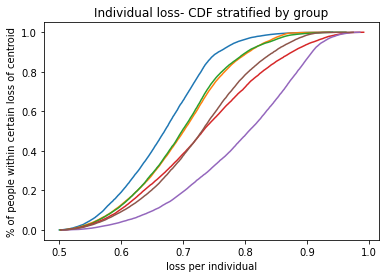

iteration number:  22
subgroup loss:  0.07646463794460501
0.7193084273708863
Time elapsed Assignment Step:  0.3878664970397949


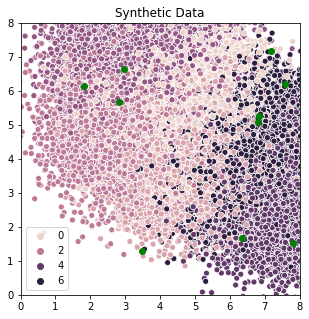

Time elapsed Batch Step:  0.021813631057739258
Time elapsed Assignment Step:  0.37934398651123047


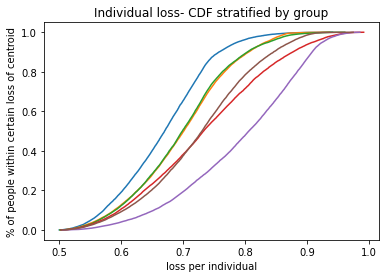

iteration number:  23
subgroup loss:  0.07646463794460501
0.7196214039620359
Time elapsed Assignment Step:  0.3605015277862549


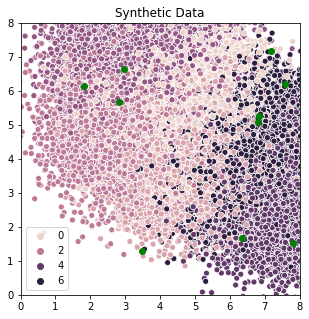

Time elapsed Batch Step:  0.021139860153198242
Time elapsed Assignment Step:  0.37171053886413574


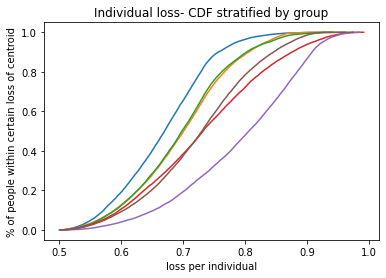

iteration number:  24
subgroup loss:  0.07646463794460501
0.7193455620860039
Time elapsed Assignment Step:  0.35080528259277344


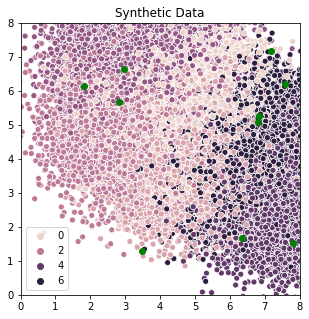

Time elapsed Batch Step:  0.02157306671142578
Time elapsed Assignment Step:  0.37500834465026855


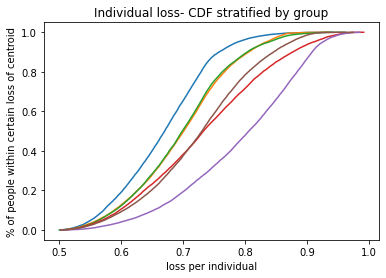

iteration number:  25
subgroup loss:  0.07646463794460501
0.719589420368091
Time elapsed Assignment Step:  0.35767197608947754


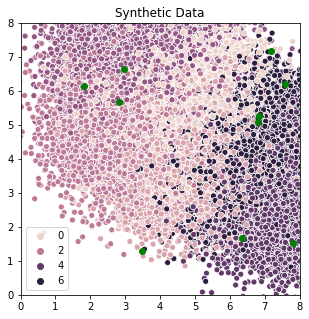

Time elapsed Batch Step:  0.021249771118164062
Time elapsed Assignment Step:  0.3792121410369873


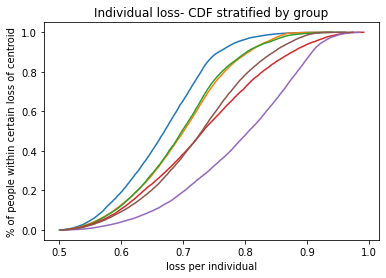

iteration number:  26
subgroup loss:  0.07646463794460501
0.719374422081039
Time elapsed Assignment Step:  0.3550443649291992


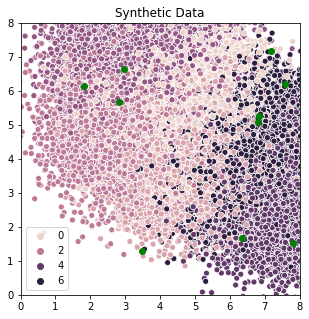

Time elapsed Batch Step:  0.021653175354003906
Time elapsed Assignment Step:  0.37259912490844727


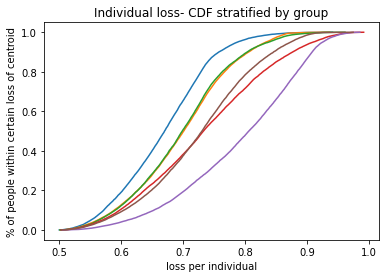

iteration number:  27
subgroup loss:  0.07646463794460501
0.719564413352434
Time elapsed Assignment Step:  0.3505992889404297


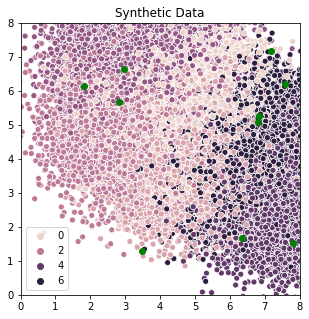

Time elapsed Batch Step:  0.02090167999267578
Time elapsed Assignment Step:  0.37226033210754395


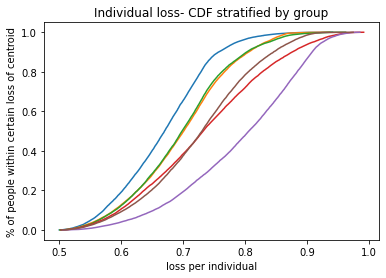

iteration number:  28
subgroup loss:  0.07646463794460501
0.7193968626686607
Time elapsed Assignment Step:  0.3549308776855469


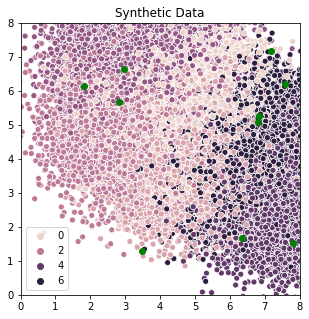

Time elapsed Batch Step:  0.020761966705322266
Time elapsed Assignment Step:  0.3772578239440918


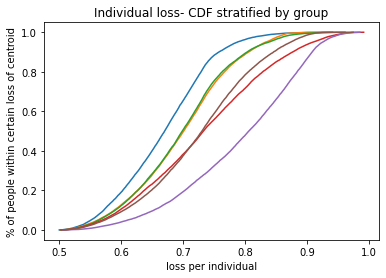

iteration number:  29
subgroup loss:  0.07646463794460501
0.7195448952469831
Time elapsed Assignment Step:  0.368161678314209


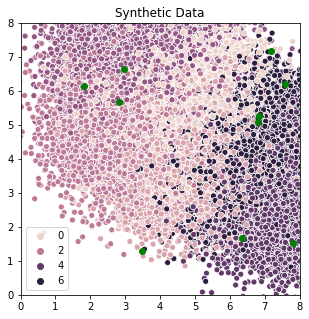

Time elapsed Batch Step:  0.02131056785583496
Time elapsed Assignment Step:  0.3766498565673828


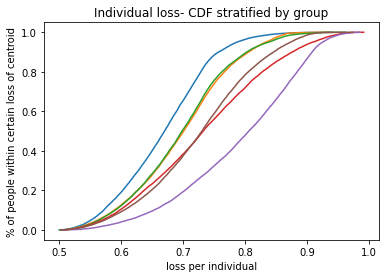

iteration number:  30
subgroup loss:  0.07646463794460501
0.7194143297797891
Time elapsed Assignment Step:  0.36574482917785645


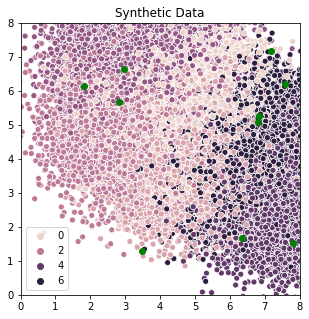

Time elapsed Batch Step:  0.02454400062561035
Time elapsed Assignment Step:  0.3922715187072754


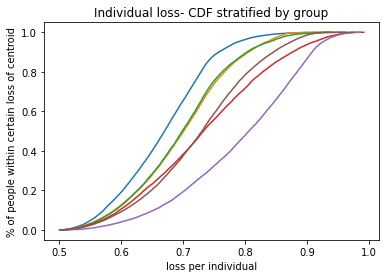

iteration number:  31
subgroup loss:  0.07646463794460501
0.7195296653597879
Time elapsed Assignment Step:  0.35251498222351074


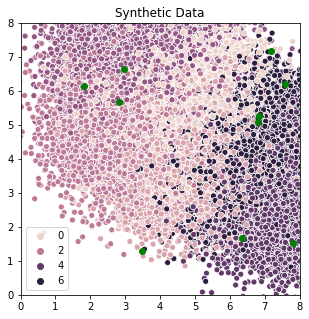

Time elapsed Batch Step:  0.020995616912841797
Time elapsed Assignment Step:  0.3685576915740967


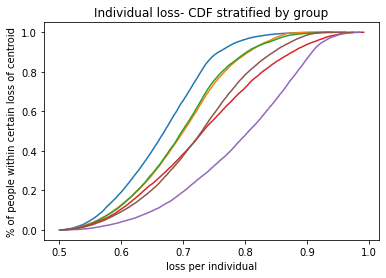

iteration number:  32
subgroup loss:  0.07646463794460501
0.7194279191263516
Time elapsed Assignment Step:  0.35029101371765137


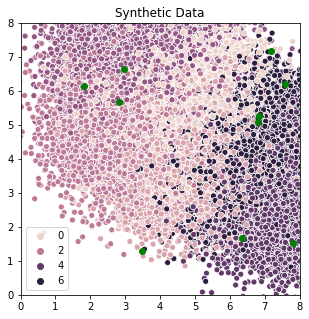

Time elapsed Batch Step:  0.020881175994873047
Time elapsed Assignment Step:  0.36849522590637207


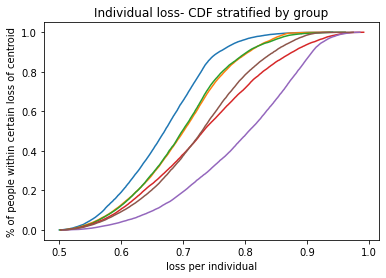

iteration number:  33
subgroup loss:  0.07646463794460501
0.7195177942223318
Time elapsed Assignment Step:  0.34780359268188477


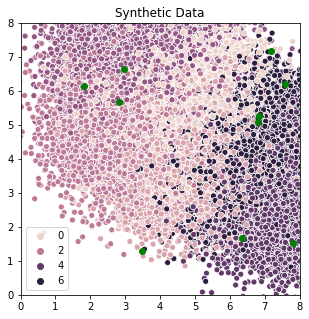

Time elapsed Batch Step:  0.021080493927001953
Time elapsed Assignment Step:  0.36994385719299316


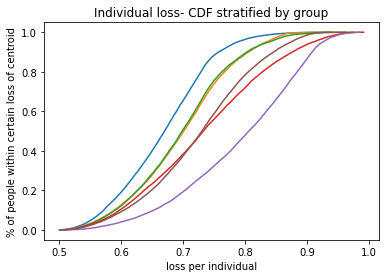

iteration number:  34
subgroup loss:  0.07646463794460501
0.7194384983059341
Time elapsed Assignment Step:  0.35480618476867676


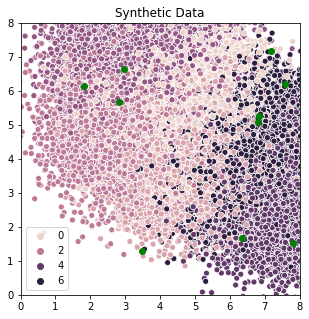

Time elapsed Batch Step:  0.02287459373474121
Time elapsed Assignment Step:  0.3808174133300781


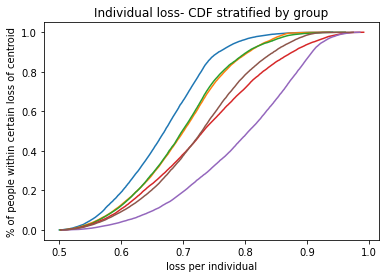

iteration number:  35
subgroup loss:  0.07646463794460501
0.719508537779845
Time elapsed Assignment Step:  0.36072874069213867


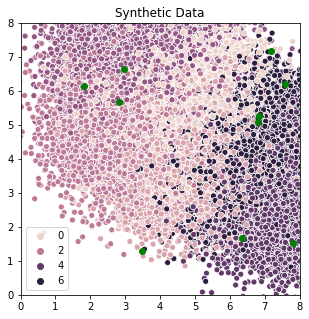

Time elapsed Batch Step:  0.021633386611938477
Time elapsed Assignment Step:  0.3762178421020508


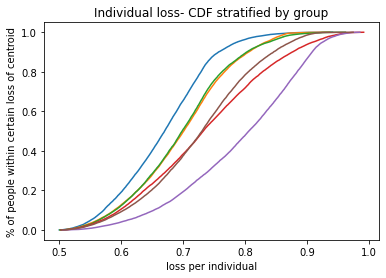

iteration number:  36
subgroup loss:  0.07646463794460501
0.719446730507624
Time elapsed Assignment Step:  0.3712329864501953


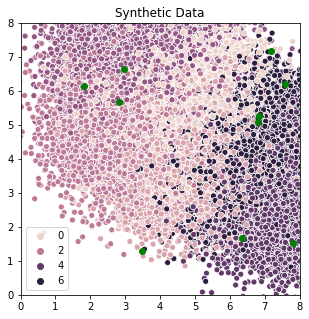

Time elapsed Batch Step:  0.020734786987304688
Time elapsed Assignment Step:  0.37969017028808594


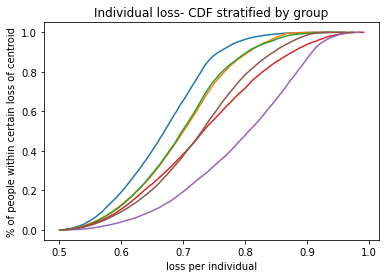

iteration number:  37
subgroup loss:  0.07646463794460501
0.719501315293628
Time elapsed Assignment Step:  0.3579878807067871


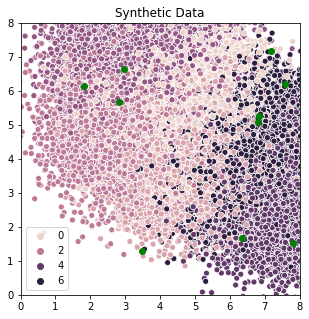

Time elapsed Batch Step:  0.02131962776184082
Time elapsed Assignment Step:  0.38323473930358887


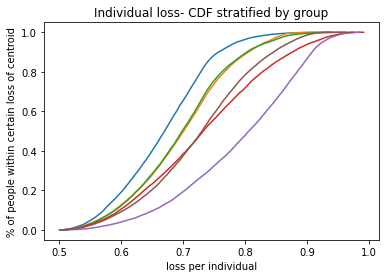

iteration number:  38
subgroup loss:  0.07646463794460501
0.7194531391212421
Time elapsed Assignment Step:  0.353442907333374


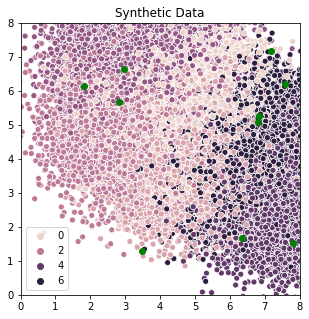

Time elapsed Batch Step:  0.021494626998901367
Time elapsed Assignment Step:  0.3704214096069336


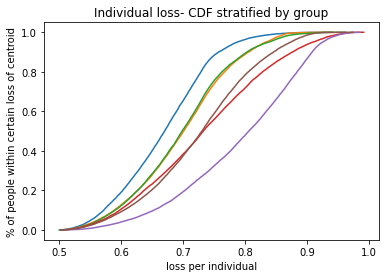

iteration number:  39
subgroup loss:  0.07646463794460501
0.7194956812631029
Time elapsed Assignment Step:  0.3504519462585449


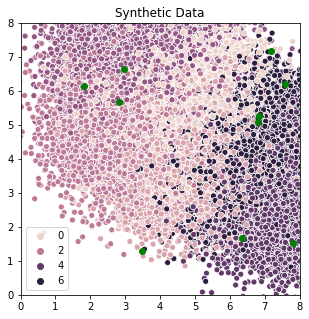

Time elapsed Batch Step:  0.022432565689086914
Time elapsed Assignment Step:  0.37020277976989746


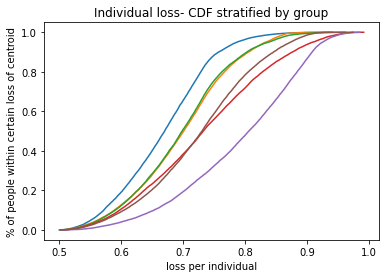

iteration number:  40
subgroup loss:  0.07646463794460501
0.7194581264824125
Time elapsed Assignment Step:  0.3559706211090088


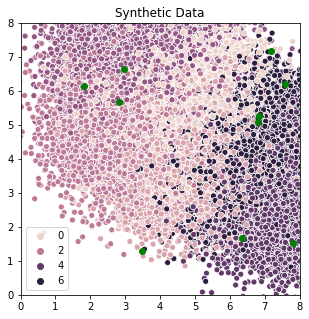

Time elapsed Batch Step:  0.021250247955322266
Time elapsed Assignment Step:  0.3716766834259033


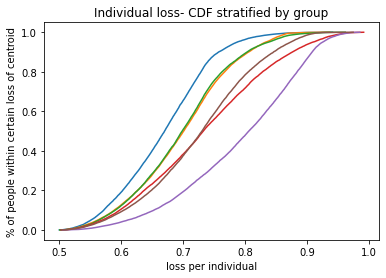

iteration number:  41
subgroup loss:  0.07646463794460501
0.7194912870441413
Time elapsed Assignment Step:  0.3592820167541504


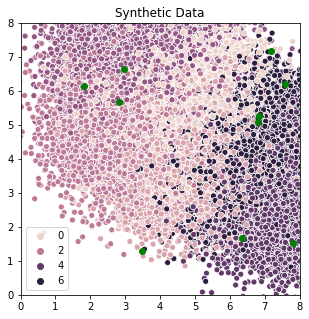

Time elapsed Batch Step:  0.023743867874145508
Time elapsed Assignment Step:  0.37952685356140137


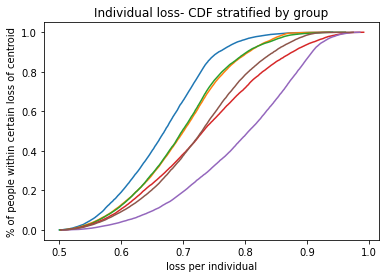

iteration number:  42
subgroup loss:  0.07646463794460501
0.7194620096014848
Time elapsed Assignment Step:  0.36486244201660156


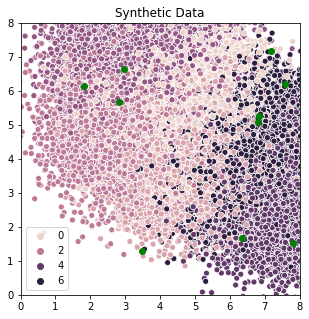

Time elapsed Batch Step:  0.02284097671508789
Time elapsed Assignment Step:  0.39297032356262207


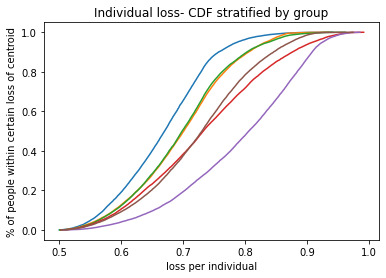

iteration number:  43
subgroup loss:  0.07646463794460501
0.7194878591314763
Time elapsed Assignment Step:  0.35534143447875977


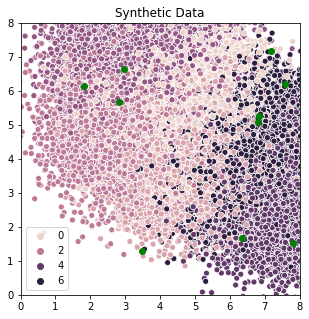

Time elapsed Batch Step:  0.023099184036254883
Time elapsed Assignment Step:  0.3837144374847412


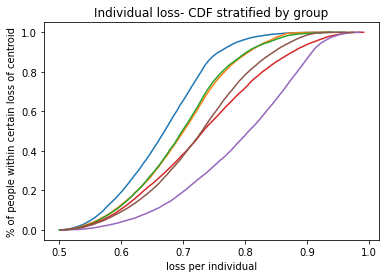

iteration number:  44
subgroup loss:  0.07646463794460501
0.7194650361166183
Time elapsed Assignment Step:  0.3670694828033447


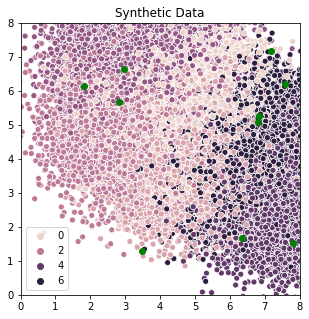

Time elapsed Batch Step:  0.027439117431640625
Time elapsed Assignment Step:  0.3819403648376465


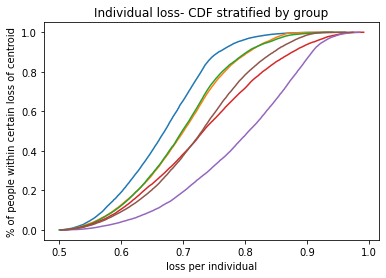

iteration number:  45
subgroup loss:  0.07646463794460501
0.7194851858570558
Time elapsed Assignment Step:  0.34687328338623047


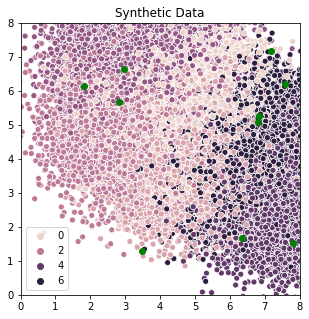

Time elapsed Batch Step:  0.02127361297607422
Time elapsed Assignment Step:  0.36815428733825684


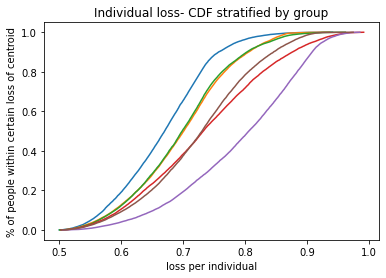

iteration number:  46
subgroup loss:  0.07646463794460501
0.7194673954758218
Time elapsed Assignment Step:  0.35588741302490234


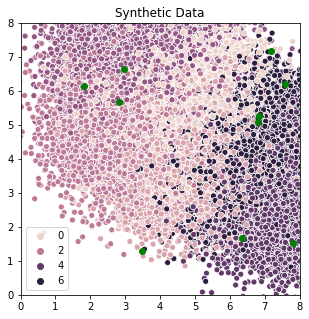

Time elapsed Batch Step:  0.022567033767700195
Time elapsed Assignment Step:  0.3699662685394287


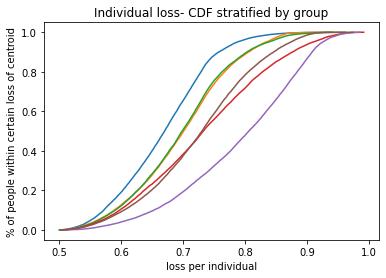

iteration number:  47
subgroup loss:  0.07646463794460501
0.7194831020500669
Time elapsed Assignment Step:  0.36017751693725586


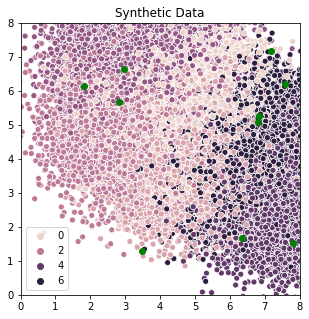

Time elapsed Batch Step:  0.02421879768371582
Time elapsed Assignment Step:  0.3872959613800049


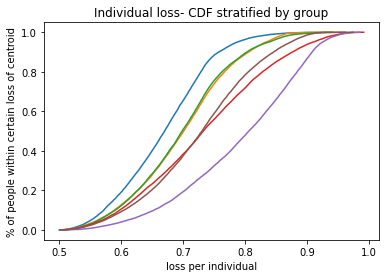

iteration number:  48
subgroup loss:  0.07646463794460501
0.7194692336334623
Time elapsed Assignment Step:  0.3581578731536865


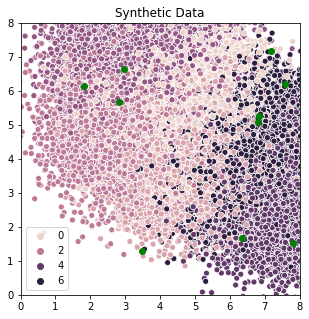

Time elapsed Batch Step:  0.03553009033203125
Time elapsed Assignment Step:  0.36409497261047363


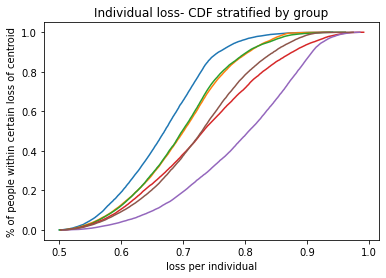

iteration number:  49
subgroup loss:  0.07646463794460501
0.7194814775706894
Time elapsed Assignment Step:  0.3611600399017334


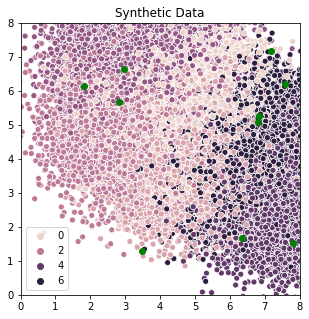

Time elapsed Batch Step:  0.021605253219604492
Time elapsed Assignment Step:  0.38915252685546875


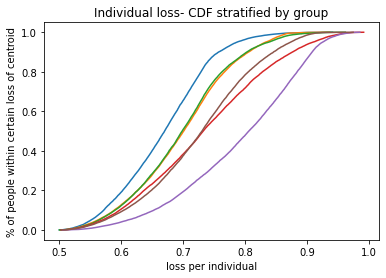

iteration number:  50
subgroup loss:  0.07646463794460501
0.7194706664045578
Time elapsed Assignment Step:  0.35814857482910156


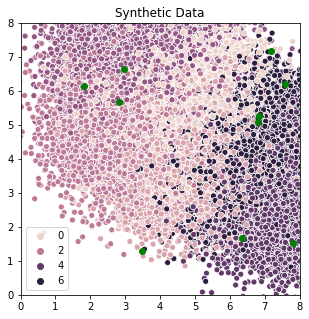

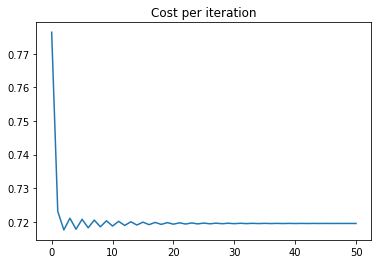

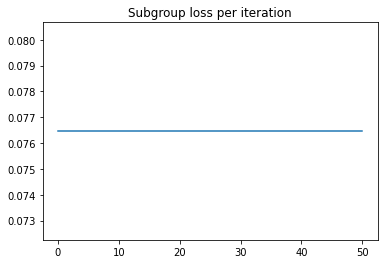

Reached max iterations


{0: (1.820781430370855, 6.158621191135704),
 1: (6.835808831945191, 5.2578099035785435),
 2: (3.470388440490466, 1.301857372074529),
 3: (6.8115517236446115, 5.0791945819833035),
 4: (6.338387426991719, 1.6806696687768272),
 5: (7.166814273946987, 7.182729628703705),
 6: (7.820684536592189, 1.511441240757951),
 7: (2.971424358462808, 6.63864832698682),
 8: (2.832353372081042, 5.688609582546331),
 9: (7.591359024736738, 6.192478912806945)}

In [16]:
df = assign_cluster(df, centroids)
df
loss = sum_loss(df, centroids)
loss 
update(.7, centroids,loss,df)

In [17]:
centroids 

{0: (1.820781430370855, 6.158621191135704),
 1: (6.835808831945191, 5.2578099035785435),
 2: (3.470388440490466, 1.301857372074529),
 3: (6.8115517236446115, 5.0791945819833035),
 4: (6.338387426991719, 1.6806696687768272),
 5: (7.166814273946987, 7.182729628703705),
 6: (7.820684536592189, 1.511441240757951),
 7: (2.971424358462808, 6.63864832698682),
 8: (2.832353372081042, 5.688609582546331),
 9: (7.591359024736738, 6.192478912806945)}